# LSTM Prediction

## Dataset

https://archive.ics.uci.edu/dataset/1175/pgcb+hourly+generation+dataset+(bangladesh)

This dataset, published by the Power Grid Company of Bangladesh (PGCB), provides hourly records of electricity generation, demand, and loadshedding across the national grid. It includes breakdowns by generation source, enabling advanced analysis of grid operations, forecasting, and generation mix optimization. PGCB is the sole national transmission operator in Bangladesh, overseeing a complex mixed-technology power grid. With an installed capacity of ~25,700 MW and full transmission coverage, it plays a key role in ensuring grid stability and managing system reliability.

## Import

In [1]:
# ============================================================================
# BLOCK 1: IMPORTS
# ============================================================================
import sys
import os
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd

import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt

from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.regularizers import l2

# my custom libraries path
MY_LIB_PATH = r"/home/seba/Documentos/Data Science Projects/seba-libs"
sys.path.append(MY_LIB_PATH)

from exploratory_data_analysis import ExploratoryDataAnalysis
from model_preparation import ModelPreparation

print("✓ All libraries imported successfully")

2025-11-19 15:35:56.416905: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-11-19 15:35:56.441171: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI AVX512_BF16 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


✓ All libraries imported successfully


2025-11-19 15:35:57.015828: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.


In [2]:
import pandas as pd

# Cargar el Excel
df = pd.read_excel("datasets/PGCB_date_power_demand.xlsx")

# Ver las primeras filas
df.head()


,datetime,generation_mw,demand_mw,load_shedding,gas,liquid_fuel,coal,hydro,solar,wind,india_bheramara_hvdc,india_tripura,india_adani,nepal,remarks
0,2015-04-19 22:00:00,6323.0,6323,0,0,0,0,0,NaN,NaN,0,0,NaN,NaN,NaN
1,2015-04-19 21:00:00,6667.0,6667,0,0,0,0,0,NaN,NaN,0,0,NaN,NaN,NaN
2,2015-04-19 19:00:00,6897.0,6897,0,4415,1836,161,41,NaN,NaN,444,0,NaN,NaN,NaN
3,2015-04-19 18:30:00,6933.0,6933,0,4423,1862,159,45,NaN,NaN,444,0,NaN,NaN,Evening_Peak
4,2015-04-19 18:00:00,6874.0,6874,0,4319,1892,155,65,NaN,NaN,443,0,NaN,NaN,NaN


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 92650 entries, 0 to 92649
Data columns (total 15 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   datetime              92650 non-null  datetime64[ns]
 1   generation_mw         92650 non-null  float64       
 2   demand_mw             92650 non-null  int64         
 3   load_shedding         92650 non-null  int64         
 4   gas                   92650 non-null  int64         
 5   liquid_fuel           92650 non-null  int64         
 6   coal                  92650 non-null  int64         
 7   hydro                 92650 non-null  int64         
 8   solar                 70517 non-null  float64       
 9   wind                  18676 non-null  float64       
 10  india_bheramara_hvdc  92650 non-null  int64         
 11  india_tripura         92650 non-null  int64         
 12  india_adani           7338 non-null   float64       
 13  nepal           

In [4]:
df.describe()

,datetime,generation_mw,demand_mw,load_shedding,gas,liquid_fuel,coal,hydro,solar,wind,india_bheramara_hvdc,india_tripura,india_adani,nepal
count,92650,9.265000e+04,92650.000000,92650.000000,92650.000000,9.265000e+04,92650.000000,92650.000000,70517.000000,18676.000000,92650.000000,92650.000000,7338.000000,5351.000000
mean,2020-05-17 03:52:07.609282304,9.429376e+03,8819.646044,81.470405,5120.782914,2.038257e+03,974.349768,96.899007,46.224101,9.233133,663.169261,93.616773,881.196375,0.546814
min,2015-04-19 00:00:00,7.300000e+01,6.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2017-10-31 06:15:00,6.814775e+03,6812.250000,0.000000,4419.000000,7.200000e+02,159.000000,40.000000,0.000000,0.000000,465.000000,70.000000,702.000000,0.000000
50%,2020-05-21 15:30:00,8.412000e+03,8422.000000,0.000000,5022.000000,1.535000e+03,401.000000,79.000000,0.000000,4.000000,705.000000,97.000000,822.000000,0.000000
75%,2022-12-03 18:22:30,1.055600e+04,10633.000000,0.000000,5812.000000,2.462000e+03,1220.000000,150.000000,25.000000,13.000000,910.000000,126.000000,1050.750000,0.000000
max,2025-06-17 12:00:00,6.452650e+07,156050.000000,65359.000000,74818.000000,2.922290e+07,31687.000000,5623.000000,2998.000000,922.000000,76292.000000,1565.000000,12665.000000,38.000000
std,NaN,2.119759e+05,2772.150108,442.757182,1138.938147,9.608105e+04,1226.515481,71.442697,106.410644,16.272517,349.609395,47.483221,369.905673,4.525897


## Clean Outliers

In [5]:
results_default, df_flagged = ExploratoryDataAnalysis.detect_outliers(
    df=df,
    min_unique_values=3,
    iqr_multiplier=3,
    show_exclusion_info=True)

results_default

🔍 Analyzing 12 of 13 numeric variables
⚙️  IQR Multiplier: 3 | Sigma Multiplier: 3
📊 Automatically excluded variables:
   - nepal: insufficient_unique_values (2 < 3)


,Feature,DataType,Method,Outlier Count,Outlier %,Lower Bound,Upper Bound,Min Value,Max Value,Mean,Median,Std Dev,Q1,Q3,IQR
7,solar,float64,IQR(3x),10210,11.02%,-75.00,100.00,0.0,2998.0,46.22,0.0,106.41,0.00,25.00,25.00
5,coal,int64,IQR(3x),1342,1.45%,-3024.00,4403.00,0.0,31687.0,974.35,401.0,1226.52,159.00,1220.00,1061.00
2,load_shedding,int64,3-sigma,1193,1.29%,-1246.80,1409.74,0.0,65359.0,81.47,0.0,442.76,0.00,0.00,0.00
8,wind,float64,IQR(3x),272,0.29%,-39.00,52.00,0.0,922.0,9.23,4.0,16.27,0.00,13.00,13.00
6,hydro,int64,IQR(3x),59,0.06%,-290.00,480.00,0.0,5623.0,96.90,79.0,71.44,40.00,150.00,110.00
10,india_tripura,int64,IQR(3x),50,0.05%,-98.00,294.00,0.0,1565.0,93.62,97.0,47.48,70.00,126.00,56.00
3,gas,int64,IQR(3x),48,0.05%,240.00,9991.00,0.0,74818.0,5120.78,5022.0,1138.94,4419.00,5812.00,1393.00
4,liquid_fuel,int64,IQR(3x),29,0.03%,-4506.00,7688.00,0.0,29222897.0,2038.26,1535.0,96081.05,720.00,2462.00,1742.00
9,india_bheramara_hvdc,int64,IQR(3x),17,0.02%,-870.00,2245.00,0.0,76292.0,663.17,705.0,349.61,465.00,910.00,445.00
1,demand_mw,int64,IQR(3x),8,0.01%,-4650.00,22095.25,6.0,156050.0,8819.65,8422.0,2772.15,6812.25,10633.00,3820.75


- generation_mw

In [6]:
# Clean a big outlier of 64526500.0 value in generation_mw
df = df[df["generation_mw"] < 60_000_000]


In [7]:
import plotly.express as px

fig = px.scatter(
    df,
    x="datetime",
    y="generation_mw",
    title="Generation (MW) over Time",
    opacity=0.7,
    height=600,
)

# Add dynamic range slider
fig.update_xaxes(rangeslider_visible=True)

fig.show()

In [8]:
# Exclude all columns except demand_mw
all_numeric = df.select_dtypes(include=['int64', 'int32', 'float64', 'float32']).columns.tolist()
exclude_cols = [col for col in all_numeric if col != 'demand_mw']

results_default, df_flagged = ExploratoryDataAnalysis.detect_outliers(
    df=df,
    exclude_columns=exclude_cols,  # Only analyze demand_mw
    min_unique_values=3,
    iqr_multiplier=3,
    show_exclusion_info=True
)



🔍 Analyzing 1 of 1 numeric variables
⚙️  IQR Multiplier: 3 | Sigma Multiplier: 3
✅ No variables were automatically excluded


In [9]:

# Convert is_outlier to categorical for better legend labels
df_flagged['outlier_label'] = df_flagged['is_outlier'].map({
    0: 'Normal',
    1: 'Outlier'
})

# Create scatter plot with color based on outlier status
fig = px.scatter(
    data_frame=df_flagged,
    x="datetime",
    y="demand_mw",
    color="outlier_label",  # Color by outlier status
    title="Demand (MW) over Time - Outliers Highlighted (IRQ > 3)",
    opacity=0.7,
    height=600,
    color_discrete_map={
        'Normal': '#1f77b4',    # Blue for normal points
        'Outlier': '#d62728'    # Red for outliers
    },
    labels={'outlier_label': 'Status'}  # Legend title
)

# Add dynamic range slider
fig.update_xaxes(rangeslider_visible=True)

# Optional: Customize marker size for better visibility
fig.update_traces(marker=dict(size=6))

fig.show()

**Inferences**  
These outliers cannot be attributed to electrical faults such as short circuits. Since the dataset contains hourly averages, a transient event lasting only seconds cannot increase the measured load by a factor of 3–8, so these values are data errors and will be removed.

In [10]:
df_flagged.loc[df_flagged['is_outlier'] == 1, ['generation_mw', 'is_outlier']]




,generation_mw,is_outlier
18997,7423.0,1
21510,8068.0,1
33392,5563.9,1
71222,10052.0,1
72872,15172.0,1
77286,11468.0,1
81981,11701.0,1
83933,11080.0,1


In [11]:
def drop_rows_by_index(df, index_to_drop):
    """
    Elimina filas de un DataFrame según un índice provisto.
    
    Parameters
    ----------
    df : pd.DataFrame
        DataFrame original.
    index_to_drop : array-like, pd.Index
        Índices de las filas a eliminar.
    
    Returns
    -------
    pd.DataFrame
        DataFrame sin las filas especificadas.
    """
    return df.drop(index=index_to_drop, errors='ignore')

outlier_index = df_flagged.loc[df_flagged['is_outlier'] == 1].index

df_clean = drop_rows_by_index(df_flagged, outlier_index)


In [12]:

# Convert is_outlier to categorical for better legend labels
df_flagged['outlier_label'] = df_flagged['is_outlier'].map({
    0: 'Normal',
    1: 'Outlier'
})

# Create scatter plot with color based on outlier status
fig = px.scatter(
    data_frame=df_clean,
    x="datetime",
    y="demand_mw",
    color="outlier_label",  # Color by outlier status
    title="Demand (MW) over Time - Without Outliers (IRQ > 3)",
    opacity=0.7,
    height=600,
    color_discrete_map={
        'Normal': '#1f77b4',    # Blue for normal points
        'Outlier': '#d62728'    # Red for outliers
    },
    labels={'outlier_label': 'Status'}  # Legend title
)

# Add dynamic range slider
fig.update_xaxes(rangeslider_visible=True)

# Optional: Customize marker size for better visibility
fig.update_traces(marker=dict(size=6))

fig.show()

## Configure data for LTSM Training

In [13]:

# ============================================================================
# BLOCK 2: KEY CONFIGURATION VARIABLES
# ============================================================================
"""
CONFIGURATION FOR REAL TIME SERIES DATA

KEY PARAMETERS EXPLAINED:

1. SEQUENCE_LENGTH (Input Window):
   - How many past time steps the LSTM uses to predict the NEXT value
   - For electricity demand with hourly data:
     * 24 = 1 day of history
     * 168 = 1 week (captures weekly patterns)
     * 336 = 2 weeks (captures longer cycles)
   - Rule: Should cover at least one complete cycle of your pattern
   - YOUR DATA: 168-336 recommended (weekly + daily patterns)

2. PREDICTION_POINTS (Visualization Only):
   - How many predictions to show in plots
   - Does NOT affect model training
   - Can be any value from 1 to len(test_set)
   - Recommendation: 168-336 (1-2 weeks) for clear visualization

3. TEST_SIZE:
   - Proportion of data for testing
   - With 92k samples: 15% = ~14k test samples (plenty!)
   - More data for training = better model

4. Model Architecture:
   - LSTM_UNITS: Neurons per layer (128→64→32 for deep learning)
   - DROPOUT_RATE: Regularization (0.2 = drop 20% of neurons)
   - Higher values = more capacity but risk overfitting

5. Training Parameters:
   - EPOCHS: Maximum training iterations (early stopping prevents overfitting)
   - BATCH_SIZE: Samples per update (larger = faster, smoother training)
   - LEARNING_RATE: Step size for optimization (lower = more stable)

6. Data Preprocessing:
   - SCALE_DATA: MUST be True for real data with large ranges!
   - SCALER_TYPE: 'minmax' (0-1) or 'standard' (mean=0, std=1)
"""

# ============================================================================
# CONFIGURATION FOR YOUR ELECTRICITY DEMAND DATA (92,641 samples)
# ============================================================================

# Data Preprocessing
SCALE_DATA = True              # CRITICAL: Scale data before training
SCALER_TYPE = 'minmax'         # Options: 'minmax' or 'standard'

# Model Input/Output Configuration
SEQUENCE_LENGTH = 168          # Look back 1 week (168 hours) to predict next hour
                              # Captures weekly patterns + daily cycles

PREDICTION_POINTS = 336        # Visualize 2 weeks (336 hours) of predictions
                              # Only affects plots, not training

TEST_SIZE = 0.15              # Use 15% for testing (~14k samples)
                              # Leaves 85% (~78k samples) for training

# Model Architecture
LSTM_UNITS_1 = 128            # First LSTM layer: 128 neurons
LSTM_UNITS_2 = 64             # Second LSTM layer: 64 neurons  
LSTM_UNITS_3 = 32             # Third LSTM layer: 32 neurons (deep architecture)
DROPOUT_RATE = 0.2            # Drop 20% of neurons during training

# Training Configuration
EPOCHS = 3 #50                   # Maximum epochs (early stopping may stop sooner)
BATCH_SIZE = 64               # Process 64 samples at a time
LEARNING_RATE = 0.0005        # Learning rate for Adam optimizer

# ============================================================================
# Display Configuration Summary
# ============================================================================
print("="*70)
print("LSTM CONFIGURATION FOR ELECTRICITY DEMAND FORECASTING")
print("="*70)
print(f"Data Preprocessing:")
print(f"  • Scaling:          {SCALE_DATA} ({SCALER_TYPE})")
print(f"  • Test Split:       {TEST_SIZE:.1%} (~14k samples for testing)")
print()
print(f"Model Configuration:")
print(f"  • Sequence Length:  {SEQUENCE_LENGTH} hours (1 week history)")
print(f"  • Architecture:     3-layer LSTM ({LSTM_UNITS_1}→{LSTM_UNITS_2}→{LSTM_UNITS_3})")
print(f"  • Dropout:          {DROPOUT_RATE:.1%} regularization")
print(f"  • Regularization:   L2 (0.001) + Batch Normalization")
print()
print(f"Training Settings:")
print(f"  • Max Epochs:       {EPOCHS}")
print(f"  • Batch Size:       {BATCH_SIZE}")
print(f"  • Learning Rate:    {LEARNING_RATE}")
print(f"  • Early Stopping:   Enabled (patience=10)")
print()
print(f"Visualization:")
print(f"  • Display Points:   {PREDICTION_POINTS} hours (~2 weeks)")
print("="*70)
print()
print("📊 Expected Performance Targets:")
print("   • MAPE < 5%:  Excellent (production ready)")
print("   • MAPE < 10%: Good (acceptable)")
print("   • MAPE < 15%: Fair (needs improvement)")
print("="*70)

LSTM CONFIGURATION FOR ELECTRICITY DEMAND FORECASTING
Data Preprocessing:
  • Scaling:          True (minmax)
  • Test Split:       15.0% (~14k samples for testing)

Model Configuration:
  • Sequence Length:  168 hours (1 week history)
  • Architecture:     3-layer LSTM (128→64→32)
  • Dropout:          20.0% regularization
  • Regularization:   L2 (0.001) + Batch Normalization

Training Settings:
  • Max Epochs:       3
  • Batch Size:       64
  • Learning Rate:    0.0005
  • Early Stopping:   Enabled (patience=10)

Visualization:
  • Display Points:   336 hours (~2 weeks)

📊 Expected Performance Targets:
   • MAPE < 5%:  Excellent (production ready)
   • MAPE < 10%: Good (acceptable)
   • MAPE < 15%: Fair (needs improvement)


## Verify temporal input data

In [14]:
df_flagged

,datetime,generation_mw,demand_mw,load_shedding,gas,liquid_fuel,coal,hydro,solar,wind,india_bheramara_hvdc,india_tripura,india_adani,nepal,remarks,is_outlier,outlier_label
0,2015-04-19 22:00:00,6323.0,6323,0,0,0,0,0,NaN,NaN,0,0,NaN,NaN,NaN,0,Normal
1,2015-04-19 21:00:00,6667.0,6667,0,0,0,0,0,NaN,NaN,0,0,NaN,NaN,NaN,0,Normal
2,2015-04-19 19:00:00,6897.0,6897,0,4415,1836,161,41,NaN,NaN,444,0,NaN,NaN,NaN,0,Normal
3,2015-04-19 18:30:00,6933.0,6933,0,4423,1862,159,45,NaN,NaN,444,0,NaN,NaN,Evening_Peak,0,Normal
4,2015-04-19 18:00:00,6874.0,6874,0,4319,1892,155,65,NaN,NaN,443,0,NaN,NaN,NaN,0,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
92645,2025-06-17 04:00:00,12698.0,12698,0,6030,834,3610,172,0.0,42.0,924,38,1010.0,38.0,NaN,0,Normal
92646,2025-06-17 03:00:00,13280.0,13280,0,6347,999,3698,172,0.0,40.0,924,38,1024.0,38.0,NaN,0,Normal
92647,2025-06-17 02:00:00,13719.0,13719,0,6340,1196,3881,172,0.0,27.0,924,36,1105.0,38.0,NaN,0,Normal
92648,2025-06-17 01:00:00,14093.0,14115,21,6323,1350,4019,172,0.0,28.0,924,38,1201.0,38.0,NaN,0,Normal


In [15]:
# ============================================================================
# BLOCK 3: VERIFY REAL DATA IS LOADED
# ============================================================================
"""
THIS BLOCK VERIFIES YOUR REAL DATA IS READY

REQUIREMENTS:
- Variable 'unified_df' must exist with your electricity demand data
- Must have a column named 'target' with the demand values (MW)
- Data should be in chronological order (time series)
"""

# Store data in wave_df for consistency with rest of code
wave_df = pd.DataFrame()
wave_df['target'] = df_flagged['demand_mw'].copy()

# Data validation
print("="*70)
print("✓ REAL DATA LOADED SUCCESSFULLY")
print("="*70)
print(f"Data Overview:")
print(f"  • Total samples:     {len(wave_df):,}")
print(f"  • Shape:             {wave_df.shape}")
print(f"  • Columns:           {wave_df.columns.tolist()}")
print()
print(f"Value Statistics (MW):")
print(f"  • Minimum:           {wave_df['target'].min():,.2f} MW")
print(f"  • Maximum:           {wave_df['target'].max():,.2f} MW")
print(f"  • Mean:              {wave_df['target'].mean():,.2f} MW")
print(f"  • Median:            {wave_df['target'].median():,.2f} MW")
print(f"  • Std Deviation:     {wave_df['target'].std():,.2f} MW")
print(f"  • Range:             {wave_df['target'].max() - wave_df['target'].min():,.2f} MW")
print()
print(f"Data Quality:")
print(f"  • Missing values:    {wave_df['target'].isna().sum()} ({wave_df['target'].isna().sum()/len(wave_df)*100:.2f}%)")
print(f"  • Zero values:       {(wave_df['target'] == 0).sum()} ({(wave_df['target'] == 0).sum()/len(wave_df)*100:.2f}%)")
print(f"  • Negative values:   {(wave_df['target'] < 0).sum()}")
print("="*70)

# Check for data issues
if wave_df['target'].isna().sum() > 0:
    print("\n⚠️  WARNING: Missing values detected!")
    print("   Consider filling or removing missing values before training")

if (wave_df['target'] < 0).any():
    print("\n⚠️  WARNING: Negative demand values detected!")
    print("   This might indicate data quality issues")

if wave_df['target'].std() == 0:
    print("\n❌ ERROR: All values are the same! Cannot train model.")
else:
    print("\n✓ Data ready for preprocessing and training")

✓ REAL DATA LOADED SUCCESSFULLY
Data Overview:
  • Total samples:     92,649
  • Shape:             (92649, 1)
  • Columns:           ['target']

Value Statistics (MW):
  • Minimum:           6.00 MW
  • Maximum:           156,050.00 MW
  • Mean:              8,819.67 MW
  • Median:            8,422.00 MW
  • Std Deviation:     2,772.15 MW
  • Range:             156,044.00 MW

Data Quality:
  • Missing values:    0 (0.00%)
  • Zero values:       0 (0.00%)
  • Negative values:   0

✓ Data ready for preprocessing and training


In [16]:
import pandas as pd
from typing import Tuple, Dict, Any

def validate_time_series_data(
    data: pd.DataFrame, 
    value_column: str,
    output_column: str = 'target',
    verbose: bool = True
) -> Tuple[pd.DataFrame, Dict[str, Any]]:
    """
    Validate time series data for machine learning projects.
    
    Parameters:
    -----------
    data : pd.DataFrame
        Input dataframe containing time series data
    value_column : str
        Name of the column containing the time series values
    output_column : str, default='target'
        Name of the output column in the returned dataframe  
    verbose : bool, default=True
        Whether to print detailed validation information
    
    Returns:
    --------
    Tuple[pd.DataFrame, Dict[str, Any]]
        - processed_df: Processed dataframe with standardized column name
        - validation_stats: Dictionary containing comprehensive data statistics and quality metrics
    
    Raises:
    -------
    ValueError: If required columns are missing or data has critical issues
    """
    
    # Input validation
    if value_column not in data.columns:
        raise ValueError(f"Value column '{value_column}' not found in dataframe. Available columns: {list(data.columns)}")
    
    if data.empty:
        raise ValueError("Input dataframe is empty")
    
    # Initialize output dataframe
    processed_df = pd.DataFrame()
    processed_df[output_column] = data[value_column].copy()
    
    # Calculate comprehensive statistics
    validation_stats = {
        'total_samples': len(processed_df),
        'data_shape': processed_df.shape,
        'data_columns': processed_df.columns.tolist(),
        'value_statistics': {
            'min': processed_df[output_column].min(),
            'max': processed_df[output_column].max(),
            'mean': processed_df[output_column].mean(),
            'median': processed_df[output_column].median(),
            'std': processed_df[output_column].std(),
            'range': processed_df[output_column].max() - processed_df[output_column].min(),
            'variance': processed_df[output_column].var()
        },
        'data_quality': {
            'missing_count': processed_df[output_column].isna().sum(),
            'missing_percentage': processed_df[output_column].isna().sum() / len(processed_df) * 100,
            'zero_count': (processed_df[output_column] == 0).sum(),
            'zero_percentage': (processed_df[output_column] == 0).sum() / len(processed_df) * 100,
            'negative_count': (processed_df[output_column] < 0).sum(),
            'infinite_count': np.isinf(processed_df[output_column]).sum() if hasattr(processed_df[output_column], 'dtype') and np.issubdtype(processed_df[output_column].dtype, np.number) else 0
        },
        'validation_flags': {
            'has_missing_values': processed_df[output_column].isna().sum() > 0,
            'has_negative_values': (processed_df[output_column] < 0).any(),
            'has_zero_values': (processed_df[output_column] == 0).any(),
            'has_infinite_values': np.isinf(processed_df[output_column]).any() if hasattr(processed_df[output_column], 'dtype') and np.issubdtype(processed_df[output_column].dtype, np.number) else False,
            'is_constant_series': processed_df[output_column].std() == 0,
            'is_empty_series': len(processed_df) == 0,
            'is_ready_for_training': processed_df[output_column].std() != 0 and not processed_df[output_column].isna().all()
        }
    }
    
    if verbose:
        _print_validation_summary(processed_df, output_column, validation_stats)
    
    # Check for critical data issues
    if validation_stats['validation_flags']['is_constant_series']:
        raise ValueError("All time series values are identical - cannot train meaningful models")
    
    if validation_stats['validation_flags']['is_empty_series']:
        raise ValueError("Time series data is empty")
    
    if validation_stats['data_quality']['missing_count'] == len(processed_df):
        raise ValueError("All time series values are missing")
    
    return processed_df, validation_stats


def _print_validation_summary(processed_df: pd.DataFrame, output_column: str, stats: Dict[str, Any]) -> None:
    """Print formatted time series validation summary."""
    
    print("=" * 70)
    print("📊 TIME SERIES DATA VALIDATION REPORT")
    print("=" * 70)
    
    print("DATA OVERVIEW:")
    print(f"  • Total observations: {stats['total_samples']:,}")
    print(f"  • Data shape:         {stats['data_shape']}")
    print(f"  • Data columns:       {stats['data_columns']}")
    
    print("\nVALUE STATISTICS:")
    vals = stats['value_statistics']
    print(f"  • Minimum:            {vals['min']:,.4f}")
    print(f"  • Maximum:            {vals['max']:,.4f}")
    print(f"  • Mean:               {vals['mean']:,.4f}")
    print(f"  • Median:             {vals['median']:,.4f}")
    print(f"  • Std Deviation:      {vals['std']:,.4f}")
    print(f"  • Variance:           {vals['variance']:,.4f}")
    print(f"  • Value Range:        {vals['range']:,.4f}")
    
    print("\nDATA QUALITY ASSESSMENT:")
    quality = stats['data_quality']
    print(f"  • Missing values:     {quality['missing_count']} ({quality['missing_percentage']:.2f}%)")
    print(f"  • Zero values:        {quality['zero_count']} ({quality['zero_percentage']:.2f}%)")
    print(f"  • Negative values:    {quality['negative_count']}")
    if quality['infinite_count'] > 0:
        print(f"  • Infinite values:    {quality['infinite_count']}")
    
    print("\nVALIDATION STATUS:")
    flags = stats['validation_flags']
    status_icons = {True: "❌", False: "✅"}
    print(f"  • Missing values:     {status_icons[flags['has_missing_values']]}")
    print(f"  • Negative values:    {status_icons[flags['has_negative_values']]}")
    print(f"  • Zero values:        {status_icons[flags['has_zero_values']]}")
    print(f"  • Infinite values:    {status_icons[flags['has_infinite_values']]}")
    print(f"  • Constant series:    {status_icons[flags['is_constant_series']]}")
    
    print("=" * 70)
    
    # Generate actionable warnings
    warnings = []
    if flags['has_missing_values']:
        warnings.append("Missing values detected - consider imputation or removal")
    
    if flags['has_negative_values']:
        warnings.append("Negative values present - verify if this is expected for your use case")
    
    if flags['has_infinite_values']:
        warnings.append("Infinite values found - these may cause numerical instability")
    
    if flags['is_constant_series']:
        warnings.append("Constant time series - no variability for model learning")
    
    if warnings:
        print("\n⚠️  DATA QUALITY WARNINGS:")
        for i, warning in enumerate(warnings, 1):
            print(f"   {i}. {warning}")
    
    # Final readiness assessment
    if flags['is_ready_for_training']:
        print("\n✅ DATA READY FOR TIME SERIES MODELING")
    else:
        print("\n❌ DATA REQUIRES PREPROCESSING BEFORE MODELING")


# Optional: Add numpy import at the top if using infinite value checks
import numpy as np

In [17]:
wave_df, stats = validate_time_series_data(
    data=df_flagged,
    value_column='demand_mw', 
    output_column='target',
    verbose=True
)

📊 TIME SERIES DATA VALIDATION REPORT
DATA OVERVIEW:
  • Total observations: 92,649
  • Data shape:         (92649, 1)
  • Data columns:       ['target']

VALUE STATISTICS:
  • Minimum:            6.0000
  • Maximum:            156,050.0000
  • Mean:               8,819.6716
  • Median:             8,422.0000
  • Std Deviation:      2,772.1542
  • Variance:           7,684,838.6603
  • Value Range:        156,044.0000

DATA QUALITY ASSESSMENT:
  • Missing values:     0 (0.00%)
  • Zero values:        0 (0.00%)
  • Negative values:    0

VALIDATION STATUS:
  • Missing values:     ✅
  • Negative values:    ✅
  • Zero values:        ✅
  • Infinite values:    ✅
  • Constant series:    ✅

✅ DATA READY FOR TIME SERIES MODELING


## Scaling

In [18]:
# ============================================================================
# BLOCK 4: PREPARE DATA WITH SCALING
# ============================================================================
"""
CRITICAL FOR REAL DATA: SCALING/NORMALIZATION

Why scaling is essential:
- Your demand data: 6 - 20,587 MW (massive range!)
- Neural networks work best with values between 0-1 or -1 to 1
- Without scaling: gradients explode, loss stays huge, no learning

Two scaling options:
1. MinMaxScaler: Scales to [0, 1] - good for bounded data
2. StandardScaler: Scales to mean=0, std=1 - good for Gaussian data
"""

from sklearn.preprocessing import MinMaxScaler, StandardScaler

# Extract the target values
signal_values = wave_df['target'].values.reshape(-1, 1)

print("ORIGINAL DATA STATISTICS:")
print(f"  Min:  {signal_values.min():.2f}")
print(f"  Max:  {signal_values.max():.2f}")
print(f"  Mean: {signal_values.mean():.2f}")
print(f"  Std:  {signal_values.std():.2f}")

# Initialize scaler
if SCALE_DATA:
    if SCALER_TYPE == 'minmax':
        scaler = MinMaxScaler(feature_range=(0, 1))
        print(f"\n✓ Applying MinMaxScaler (0-1 range)")
    else:
        scaler = StandardScaler()
        print(f"\n✓ Applying StandardScaler (mean=0, std=1)")
    
    # Fit scaler on ALL data and transform
    scaled_values = scaler.fit_transform(signal_values)
    
    print("SCALED DATA STATISTICS:")
    print(f"  Min:  {scaled_values.min():.4f}")
    print(f"  Max:  {scaled_values.max():.4f}")
    print(f"  Mean: {scaled_values.mean():.4f}")
    print(f"  Std:  {scaled_values.std():.4f}")
else:
    scaled_values = signal_values
    scaler = None
    print("\n⚠️  WARNING: Data not scaled - may cause training issues!")

# Create unified dataframe with scaled values
unified_df = pd.DataFrame({
    'signal': scaled_values.flatten(),
    'target': scaled_values.flatten()
})

print(f"\n✓ Data prepared for LSTM")
print(f"  Shape: {unified_df.shape}")
print(f"  Ready for sequence creation")

ORIGINAL DATA STATISTICS:
  Min:  6.00
  Max:  156050.00
  Mean: 8819.67
  Std:  2772.14

✓ Applying MinMaxScaler (0-1 range)
SCALED DATA STATISTICS:
  Min:  0.0000
  Max:  1.0000
  Mean: 0.0565
  Std:  0.0178

✓ Data prepared for LSTM
  Shape: (92649, 2)
  Ready for sequence creation


## Train-Test Split & Windowed Squences

In [19]:
# ============================================================================
# BLOCK 5: TEMPORAL TRAIN-TEST SPLIT
# ============================================================================
# Use temporal split (no shuffling) to preserve time series order
X_train, X_test, y_train, y_test = ModelPreparation.temporal_train_test_split(
    unified_df=unified_df,
    target_col='target',
    test_size=TEST_SIZE
)

print("\n✓ Data split completed")


# ============================================================================
# BLOCK 6: CREATE WINDOWED SEQUENCES
# ============================================================================
# Create sequences for LSTM input
X_train_seq, X_test_seq, y_train_seq, y_test_seq = ModelPreparation.create_window_sequences(
    X_train=X_train,
    X_test=X_test,
    y_train=y_train,
    y_test=y_test,
    seq_length=SEQUENCE_LENGTH
)

print("\n✓ Sequences created successfully")
print(f"  X_train_seq shape: {X_train_seq.shape} -> (samples, sequence_length, features)")
print(f"  y_train_seq shape: {y_train_seq.shape} -> (samples,)")

Shape of X_train: (78751, 1)
Shape of X_test: (13898, 1)
Shape of y_train: (78751,)
Shape of y_test: (13898,)

✓ Data split completed
Shape of X_train_seq: (78583, 168, 1)
Shape of X_test_seq: (13730, 168, 1)
Shape of y_train_seq: (78583,)
Shape of y_test_seq: (13730,)

✓ Sequences created successfully
  X_train_seq shape: (78583, 168, 1) -> (samples, sequence_length, features)
  y_train_seq shape: (78583,) -> (samples,)


## Build LSTM

In [20]:

# ============================================================================
# BLOCK 7: BUILD LSTM MODEL
# ============================================================================
"""
ARCHITECTURE IMPROVEMENTS FOR REAL DATA:

1. Deeper network: 3 LSTM layers instead of 2
   - More capacity to learn complex patterns
   - Better for large datasets (92k samples)

2. Batch Normalization:
   - Helps with gradient flow
   - Faster, more stable training
   
3. L2 Regularization:
   - Prevents overfitting
   - Important for complex models
"""

model = Sequential([
    # First LSTM layer
    LSTM(LSTM_UNITS_1, 
         return_sequences=True, 
         input_shape=(SEQUENCE_LENGTH, X_train_seq.shape[2]),
         kernel_regularizer=l2(0.001)),  # L2 regularization
    BatchNormalization(),
    Dropout(DROPOUT_RATE),
    
    # Second LSTM layer
    LSTM(LSTM_UNITS_2, 
         return_sequences=True,
         kernel_regularizer=l2(0.001)),
    BatchNormalization(),
    Dropout(DROPOUT_RATE),
    
    # Third LSTM layer
    LSTM(LSTM_UNITS_3, 
         return_sequences=False,
         kernel_regularizer=l2(0.001)),
    BatchNormalization(),
    Dropout(DROPOUT_RATE),
    
    # Dense output layer
    Dense(1)
])

# Compile with custom learning rate and gradient clipping
from tensorflow.keras.optimizers import Adam

optimizer = Adam(
    learning_rate=LEARNING_RATE,
    clipnorm=1.0  # Gradient clipping prevents exploding gradients
)

model.compile(
    optimizer=optimizer,
    loss='mse',
    metrics=['mae', 'mape']  # Added MAPE for percentage error
)

print("\n" + "="*70)
print("IMPROVED LSTM MODEL")
print("="*70)
print(f"Architecture:")
print(f"  - Input shape: ({SEQUENCE_LENGTH}, {X_train_seq.shape[2]})")
print(f"  - 3 LSTM layers: {LSTM_UNITS_1} → {LSTM_UNITS_2} → {LSTM_UNITS_3}")
print(f"  - Batch Normalization: After each LSTM")
print(f"  - L2 Regularization: 0.001")
print(f"  - Dropout: {DROPOUT_RATE}")
print(f"  - Gradient Clipping: 1.0")
print(f"  - Total parameters: {model.count_params():,}")
print("="*70)
model.summary()


IMPROVED LSTM MODEL
Architecture:
  - Input shape: (168, 1)
  - 3 LSTM layers: 128 → 64 → 32
  - Batch Normalization: After each LSTM
  - L2 Regularization: 0.001
  - Dropout: 0.2
  - Gradient Clipping: 1.0
  - Total parameters: 129,313


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                     │ (None, 168, 128)       │        66,560 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 168, 128)       │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 168, 128)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_1 (LSTM)                   │ (None, 168, 64)        │        49,408 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 168, 64)        │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 168, 64)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_2 (LSTM)                   │ (None, 32)             │        12,416 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 32)             │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 129,313 (505.13 KB)

 Trainable params: 128,865 (503.38 KB)

 Non-trainable params: 448 (1.75 KB)

## Train Model using Callbacks

In [21]:
# ============================================================================
# BLOCK 8: TRAIN WITH ADVANCED CALLBACKS
# ============================================================================
"""
IMPROVED TRAINING STRATEGY:

1. EarlyStopping: Stop when validation stops improving
2. ReduceLROnPlateau: Reduce learning rate when stuck
3. ModelCheckpoint: Save best model
4. TensorBoard: Log training for visualization (optional)
"""

# Create callbacks
early_stop = EarlyStopping(
    monitor='val_loss',
    patience=10,              # Stop after 10 epochs without improvement
    restore_best_weights=True,
    verbose=1,
    min_delta=0.0001          # Minimum change to qualify as improvement
)

reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,               # Reduce LR by half
    patience=5,               # Wait 5 epochs before reducing
    min_lr=0.00001,
    verbose=1,
    min_delta=0.0001
)

# Save best model
checkpoint = ModelCheckpoint(
    'model/best_lstm_model.h5',
    monitor='val_loss',
    save_best_only=True,
    verbose=1
)

# Train the model
print("\n" + "="*70)
print("🚀 STARTING TRAINING")
print("="*70)
print(f"Training samples: {len(X_train_seq):,}")
print(f"Validation samples: ~{int(len(X_train_seq) * 0.2):,} (20% of training)")
print(f"Test samples: {len(X_test_seq):,}")
print(f"Total trainable parameters: {model.count_params():,}")
print("="*70)

history = model.fit(
    X_train_seq, y_train_seq,
    validation_split=0.2,
    epochs=EPOCHS,
    batch_size=BATCH_SIZE,
    callbacks=[early_stop, reduce_lr, checkpoint],
    verbose=1
)

print("\n" + "="*70)
print("✓ TRAINING COMPLETED!")
print("="*70)
print(f"Epochs trained: {len(history.history['loss'])}")
print(f"Final training loss: {history.history['loss'][-1]:.6f}")
print(f"Final validation loss: {history.history['val_loss'][-1]:.6f}")
print(f"Best validation loss: {min(history.history['val_loss']):.6f}")
print(f"Final training MAE: {history.history['mae'][-1]:.6f}")
print(f"Final validation MAE: {history.history['val_mae'][-1]:.6f}")

# Check for overfitting
train_loss = history.history['loss'][-1]
val_loss = history.history['val_loss'][-1]
overfit_ratio = val_loss / train_loss

if overfit_ratio > 1.5:
    print(f"\n⚠️  WARNING: Possible overfitting detected!")
    print(f"   Val/Train loss ratio: {overfit_ratio:.2f}")
    print(f"   Consider: Increase dropout, reduce model size, or add more data")
elif overfit_ratio > 1.2:
    print(f"\n✓ Model shows slight overfitting (ratio: {overfit_ratio:.2f})")
    print(f"   This is normal and acceptable")
else:
    print(f"\n✓ Model is well-balanced (ratio: {overfit_ratio:.2f})")

print("="*70)


🚀 STARTING TRAINING
Training samples: 78,583
Validation samples: ~15,716 (20% of training)
Test samples: 13,730
Total trainable parameters: 129,313
Epoch 1/3
983/983 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 0.5444 - mae: 0.4429 - mape: 11976.5771
Epoch 1: val_loss improved from None to 0.08080, saving model to model/best_lstm_model.h5


983/983 ━━━━━━━━━━━━━━━━━━━━ 107s 107ms/step - loss: 0.3217 - mae: 0.3086 - mape: 10920.1797 - val_loss: 0.0808 - val_mae: 0.0807 - val_mape: 125.6369 - learning_rate: 5.0000e-04
Epoch 2/3
983/983 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 0.0762 - mae: 0.0919 - mape: 1424.6676
Epoch 2: val_loss improved from 0.08080 to 0.02917, saving model to model/best_lstm_model.h5


983/983 ━━━━━━━━━━━━━━━━━━━━ 106s 108ms/step - loss: 0.0569 - mae: 0.0621 - mape: 1327.9901 - val_loss: 0.0292 - val_mae: 0.0131 - val_mape: 18.1839 - learning_rate: 5.0000e-04
Epoch 3/3
983/983 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 0.0230 - mae: 0.0133 - mape: 249.9230
Epoch 3: val_loss improved from 0.02917 to 0.00950, saving model to model/best_lstm_model.h5


983/983 ━━━━━━━━━━━━━━━━━━━━ 109s 111ms/step - loss: 0.0178 - mae: 0.0096 - mape: 550.1938 - val_loss: 0.0095 - val_mae: 0.0089 - val_mape: 13.2335 - learning_rate: 5.0000e-04
Restoring model weights from the end of the best epoch: 3.

✓ TRAINING COMPLETED!
Epochs trained: 3
Final training loss: 0.017768
Final validation loss: 0.009504
Best validation loss: 0.009504
Final training MAE: 0.009569
Final validation MAE: 0.008934

✓ Model is well-balanced (ratio: 0.53)


## Evaluate Model

In [22]:

# ============================================================================
# BLOCK 9: EVALUATE WITH INVERSE SCALING
# ============================================================================
"""
CRITICAL: Inverse transform predictions back to original scale!

After training on scaled data (0-1), we must:
1. Make predictions in scaled space
2. Inverse transform to original MW values
3. Calculate metrics in original scale
"""

# Make predictions (in scaled space)
y_pred_scaled = model.predict(X_test_seq, verbose=0)
y_pred_scaled = y_pred_scaled.flatten()

# Inverse transform to original scale
if SCALE_DATA and scaler is not None:
    y_pred = scaler.inverse_transform(y_pred_scaled.reshape(-1, 1)).flatten()
    y_test_original = scaler.inverse_transform(y_test_seq.reshape(-1, 1)).flatten()
    print("✓ Predictions inverse-transformed to original scale")
else:
    y_pred = y_pred_scaled
    y_test_original = y_test_seq
    print("✓ Using predictions as-is (no scaling)")

# Calculate metrics in ORIGINAL scale
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

mse = mean_squared_error(y_test_original, y_pred)
mae = mean_absolute_error(y_test_original, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test_original, y_pred)

# Calculate MAPE (Mean Absolute Percentage Error)
mape = np.mean(np.abs((y_test_original - y_pred) / y_test_original)) * 100

# Calculate prediction accuracy (within ±X%)
tolerance_5 = np.mean(np.abs((y_test_original - y_pred) / y_test_original) <= 0.05) * 100
tolerance_10 = np.mean(np.abs((y_test_original - y_pred) / y_test_original) <= 0.10) * 100

print("\n" + "="*70)
print("MODEL EVALUATION METRICS (Original Scale)")
print("="*70)
print(f"Mean Squared Error (MSE):    {mse:,.2f}")
print(f"Root Mean Squared Error:     {rmse:,.2f} MW")
print(f"Mean Absolute Error (MAE):   {mae:,.2f} MW")
print(f"Mean Absolute % Error (MAPE): {mape:.2f}%")
print(f"R² Score:                     {r2:.4f}")
print()
print("Prediction Accuracy:")
print(f"  Within ±5%:  {tolerance_5:.1f}% of predictions")
print(f"  Within ±10%: {tolerance_10:.1f}% of predictions")
print()
print("Data Range:")
print(f"  Actual: {y_test_original.min():,.2f} to {y_test_original.max():,.2f} MW")
print(f"  Predicted: {y_pred.min():,.2f} to {y_pred.max():,.2f} MW")
print("="*70)

# Performance interpretation
if mape < 5:
    print("\n🎯 EXCELLENT! MAPE < 5% - Production ready")
elif mape < 10:
    print("\n✓ GOOD! MAPE < 10% - Acceptable for most applications")
elif mape < 15:
    print("\n⚠️  FAIR. MAPE < 15% - Room for improvement")
else:
    print("\n❌ POOR. MAPE > 15% - Model needs significant improvement")
    print("   Suggestions:")
    print("   - Increase SEQUENCE_LENGTH (more history)")
    print("   - Add more features (temperature, day of week, holidays)")
    print("   - Try different architecture (add layers, units)")
    print("   - Check data quality (outliers, missing values)")


✓ Predictions inverse-transformed to original scale

MODEL EVALUATION METRICS (Original Scale)
Mean Squared Error (MSE):    5,367,612.23
Root Mean Squared Error:     2,316.81 MW
Mean Absolute Error (MAE):   1,588.50 MW
Mean Absolute % Error (MAPE): 14.36%
R² Score:                     0.2748

Prediction Accuracy:
  Within ±5%:  17.0% of predictions
  Within ±10%: 38.4% of predictions

Data Range:
  Actual: 143.00 to 121,000.00 MW
  Predicted: 6,539.56 to 12,569.21 MW

⚠️  FAIR. MAPE < 15% - Room for improvement


## Plot Results

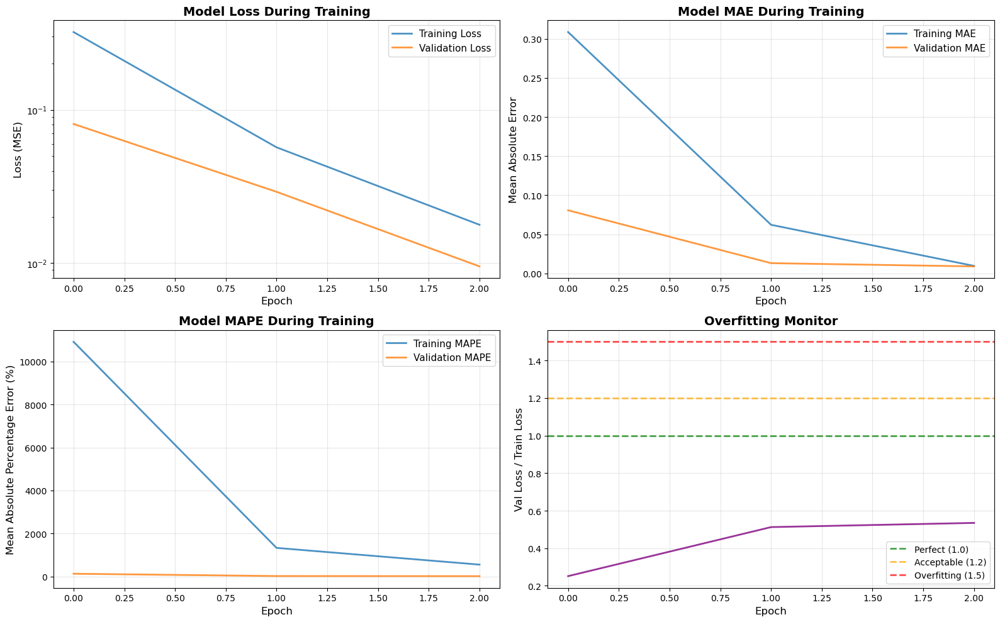


✓ Training history visualization completed


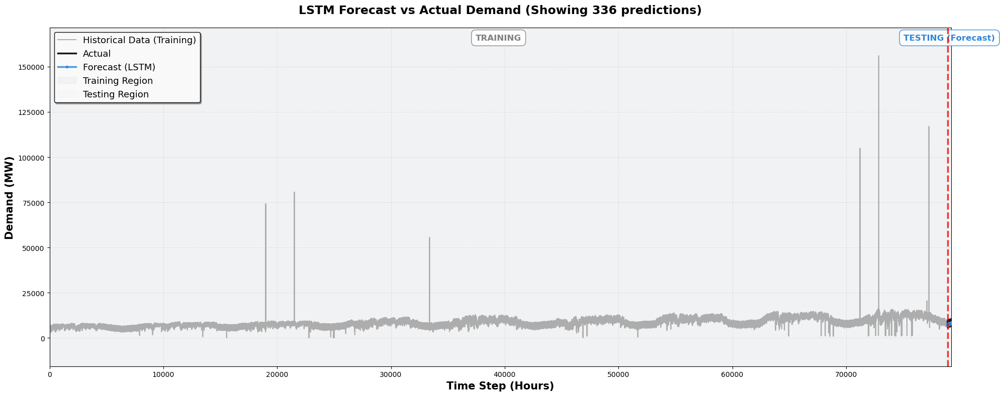

✓ Visualization shows:
  - Gray line: Historical training data
  - Black line: Actual test values
  - Blue line: LSTM predictions
  - Red line: Point where forecasting begins


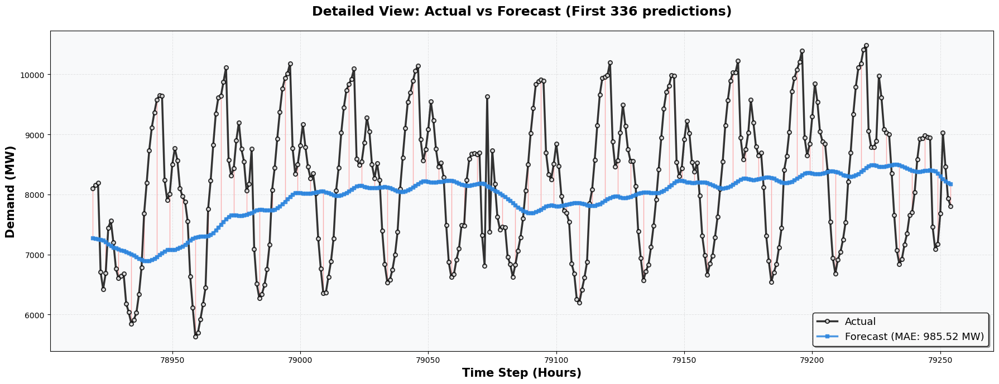

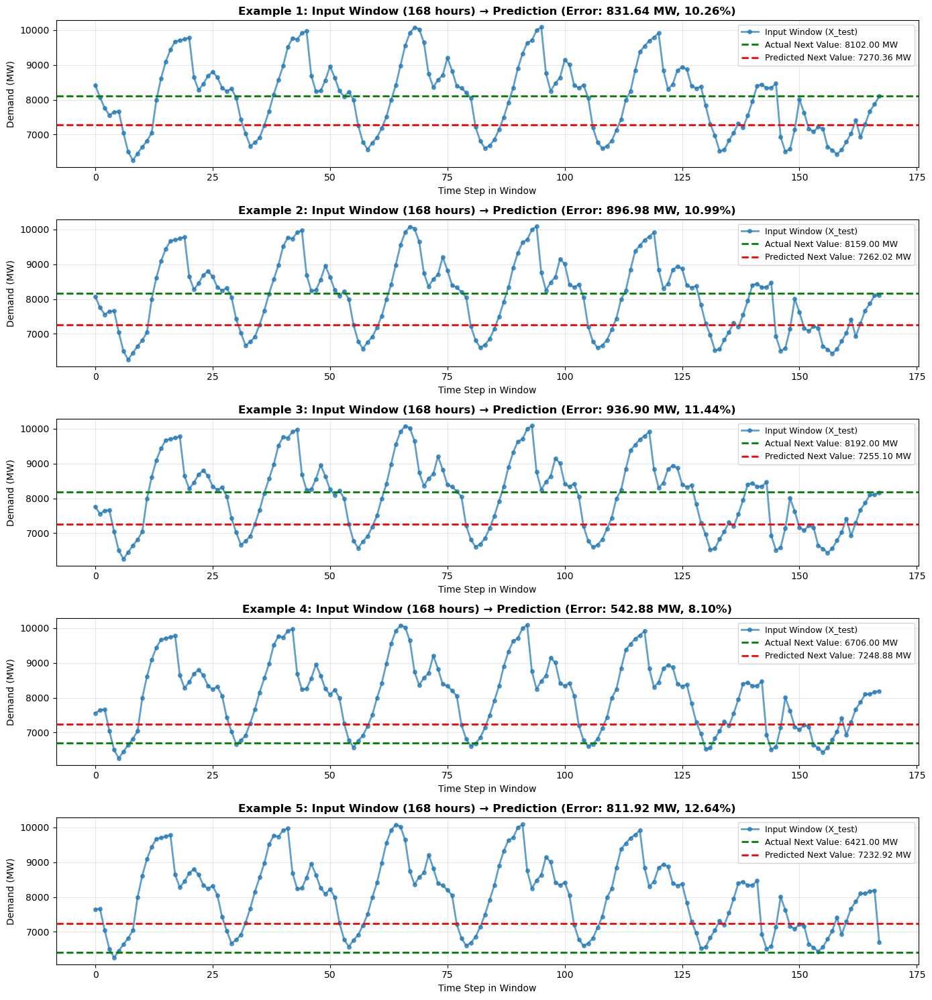


✓ All visualizations completed!


In [23]:


# ============================================================================
# BLOCK 10: PLOT TRAINING HISTORY WITH INSIGHTS
# ============================================================================
fig, axes = plt.subplots(2, 2, figsize=(16, 10))

# Plot 1: Loss (log scale for better visibility)
axes[0, 0].plot(history.history['loss'], label='Training Loss', linewidth=2, alpha=0.8)
axes[0, 0].plot(history.history['val_loss'], label='Validation Loss', linewidth=2, alpha=0.8)
axes[0, 0].set_xlabel('Epoch', fontsize=12)
axes[0, 0].set_ylabel('Loss (MSE)', fontsize=12)
axes[0, 0].set_title('Model Loss During Training', fontsize=14, fontweight='bold')
axes[0, 0].legend(fontsize=11)
axes[0, 0].grid(True, alpha=0.3)
axes[0, 0].set_yscale('log')  # Log scale for better visibility

# Plot 2: MAE
axes[0, 1].plot(history.history['mae'], label='Training MAE', linewidth=2, alpha=0.8)
axes[0, 1].plot(history.history['val_mae'], label='Validation MAE', linewidth=2, alpha=0.8)
axes[0, 1].set_xlabel('Epoch', fontsize=12)
axes[0, 1].set_ylabel('Mean Absolute Error', fontsize=12)
axes[0, 1].set_title('Model MAE During Training', fontsize=14, fontweight='bold')
axes[0, 1].legend(fontsize=11)
axes[0, 1].grid(True, alpha=0.3)

# Plot 3: MAPE (if available)
if 'mape' in history.history:
    axes[1, 0].plot(history.history['mape'], label='Training MAPE', linewidth=2, alpha=0.8)
    axes[1, 0].plot(history.history['val_mape'], label='Validation MAPE', linewidth=2, alpha=0.8)
    axes[1, 0].set_xlabel('Epoch', fontsize=12)
    axes[1, 0].set_ylabel('Mean Absolute Percentage Error (%)', fontsize=12)
    axes[1, 0].set_title('Model MAPE During Training', fontsize=14, fontweight='bold')
    axes[1, 0].legend(fontsize=11)
    axes[1, 0].grid(True, alpha=0.3)
else:
    axes[1, 0].text(0.5, 0.5, 'MAPE not available', 
                    ha='center', va='center', fontsize=14)
    axes[1, 0].axis('off')

# Plot 4: Learning Rate (if available)
if 'lr' in history.history:
    axes[1, 1].plot(history.history['lr'], label='Learning Rate', 
                    linewidth=2, alpha=0.8, color='orange')
    axes[1, 1].set_xlabel('Epoch', fontsize=12)
    axes[1, 1].set_ylabel('Learning Rate', fontsize=12)
    axes[1, 1].set_title('Learning Rate Schedule', fontsize=14, fontweight='bold')
    axes[1, 1].set_yscale('log')
    axes[1, 1].legend(fontsize=11)
    axes[1, 1].grid(True, alpha=0.3)
else:
    # Plot overfitting analysis
    train_loss = np.array(history.history['loss'])
    val_loss = np.array(history.history['val_loss'])
    overfit_ratio = val_loss / train_loss
    
    axes[1, 1].plot(overfit_ratio, linewidth=2, alpha=0.8, color='purple')
    axes[1, 1].axhline(y=1.0, color='green', linestyle='--', 
                       linewidth=2, label='Perfect (1.0)', alpha=0.7)
    axes[1, 1].axhline(y=1.2, color='orange', linestyle='--', 
                       linewidth=2, label='Acceptable (1.2)', alpha=0.7)
    axes[1, 1].axhline(y=1.5, color='red', linestyle='--', 
                       linewidth=2, label='Overfitting (1.5)', alpha=0.7)
    axes[1, 1].set_xlabel('Epoch', fontsize=12)
    axes[1, 1].set_ylabel('Val Loss / Train Loss', fontsize=12)
    axes[1, 1].set_title('Overfitting Monitor', fontsize=14, fontweight='bold')
    axes[1, 1].legend(fontsize=10)
    axes[1, 1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

print("\n✓ Training history visualization completed")


# ============================================================================
# BLOCK 11: VISUALIZE PREDICTIONS OVER ORIGINAL TIME SERIES
# ============================================================================
# Reconstruct the full time series to show where predictions occur

# Get the original time values from the test set
# Remember: we lost SEQUENCE_LENGTH points when creating sequences
train_size = len(X_train)
test_start_idx = train_size + SEQUENCE_LENGTH  # Where test predictions start

# Get original signal from wave_df (before scaling)
original_signal = wave_df['target'].values

# For time axis, create indices
time_indices = np.arange(len(original_signal))

# Calculate indices for predictions
pred_start_idx = test_start_idx
pred_end_idx = pred_start_idx + len(y_pred)

# Time indices for predictions
time_pred = time_indices[pred_start_idx:pred_end_idx]

# Limit visualization points if needed
n_points = min(PREDICTION_POINTS, len(y_pred))

# Create the main plot
fig, ax = plt.subplots(figsize=(20, 8))

# Plot TRAINING portion of original signal (gray)
train_end_idx = pred_start_idx
train_mask = time_indices < train_end_idx
ax.plot(time_indices[train_mask], original_signal[train_mask], 
        'gray', linewidth=1.5, label='Historical Data (Training)', alpha=0.6, zorder=1)

# Plot TEST portion of original signal (black/actual)
test_mask = (time_indices >= train_end_idx) & (time_indices < pred_end_idx)
ax.plot(time_indices[test_mask], original_signal[test_mask], 
        'k-', linewidth=2.5, label='Actual', alpha=0.9, zorder=2)

# Plot predictions (blue with markers for clarity)
ax.plot(time_pred[:n_points], y_pred[:n_points], 
        color='#2E86DE', linewidth=2.5, marker='o', markersize=3,
        label='Forecast (LSTM)', alpha=0.85, zorder=3)

# Add subtle shaded area for forecast
ax.fill_between(time_pred[:n_points], 
                y_pred[:n_points] - mae,  # Use MAE as confidence band
                y_pred[:n_points] + mae, 
                alpha=0.2, color='#2E86DE', zorder=1)

# Mark the transition point clearly
ax.axvline(x=train_end_idx, color='red', linestyle='--', 
           linewidth=2.5, alpha=0.8, zorder=4)

# Add shaded regions to clearly show Training vs Testing
ax.axvspan(time_indices[0], train_end_idx, alpha=0.05, color='gray', zorder=0, label='Training Region')
ax.axvspan(train_end_idx, time_pred[n_points-1], alpha=0.05, color='lightblue', zorder=0, label='Testing Region')

# Add text annotations at the top of the plot
y_top = original_signal.max() + (original_signal.max() - original_signal.min()) * 0.05
mid_train_idx = time_indices[0] + (train_end_idx - time_indices[0]) / 2
mid_test_idx = train_end_idx + (time_pred[n_points-1] - train_end_idx) / 2

ax.text(mid_train_idx, y_top, 'TRAINING', 
        fontsize=12, color='gray', fontweight='bold',
        horizontalalignment='center', verticalalignment='bottom',
        bbox=dict(boxstyle='round,pad=0.5', facecolor='white', edgecolor='gray', alpha=0.9))

ax.text(mid_test_idx, y_top, 'TESTING (Forecast)', 
        fontsize=12, color='#2E86DE', fontweight='bold',
        horizontalalignment='center', verticalalignment='bottom',
        bbox=dict(boxstyle='round,pad=0.5', facecolor='white', edgecolor='#2E86DE', alpha=0.9))

# Improved styling
ax.set_xlabel('Time Step (Hours)', fontsize=15, fontweight='bold')
ax.set_ylabel('Demand (MW)', fontsize=15, fontweight='bold')
ax.set_title(f'LSTM Forecast vs Actual Demand (Showing {n_points} predictions)', 
             fontsize=17, fontweight='bold', pad=20)

# Better legend
ax.legend(fontsize=13, loc='upper left', framealpha=0.95, 
          edgecolor='black', fancybox=True, shadow=True)

# Enhanced grid
ax.grid(True, alpha=0.3, linestyle='--', linewidth=0.7)
ax.set_facecolor('#f8f9fa')

# Set better limits
ax.set_xlim(time_indices[0], time_pred[n_points-1])
y_margin = (original_signal.max() - original_signal.min()) * 0.1
ax.set_ylim(original_signal.min() - y_margin, original_signal.max() + y_margin)

plt.tight_layout()
plt.show()

print(f"✓ Visualization shows:")
print(f"  - Gray line: Historical training data")
print(f"  - Black line: Actual test values")
print(f"  - Blue line: LSTM predictions")
print(f"  - Red line: Point where forecasting begins")


# ============================================================================
# BLOCK 12: DETAILED COMPARISON - ACTUAL vs FORECAST (ZOOMED)
# ============================================================================
# Show a closer view of the prediction region

fig, ax = plt.subplots(figsize=(18, 7))

# Focus only on the test/prediction region
#display_points = min(150, n_points)  # Show up to 150 points for clarity
# Use PREDICTION_POINTS to control how many predicted points to display (cap at available n_points)
display_points = min(PREDICTION_POINTS, n_points)
# ...

# Plot actual values
ax.plot(time_pred[:display_points], y_test_original[:display_points], 
        'ko-', linewidth=2.5, markersize=5, label='Actual', 
        alpha=0.8, zorder=2, markerfacecolor='white', markeredgewidth=1.5)

# Plot predictions
ax.plot(time_pred[:display_points], y_pred[:display_points], 
        color='#2E86DE', linewidth=2.5, marker='s', markersize=4,
        label='Forecast', alpha=0.85, zorder=3, markerfacecolor='#2E86DE')

# Add error bars showing prediction accuracy
errors = np.abs(y_test_original[:display_points] - y_pred[:display_points])
for i in range(0, display_points, 5):  # Show every 5th error bar to avoid clutter
    ax.plot([time_pred[i], time_pred[i]], 
            [y_test_original[i], y_pred[i]], 
            'r-', alpha=0.3, linewidth=1, zorder=1)

# Styling
ax.set_xlabel('Time Step (Hours)', fontsize=15, fontweight='bold')
ax.set_ylabel('Demand (MW)', fontsize=15, fontweight='bold')
ax.set_title(f'Detailed View: Actual vs Forecast (First {display_points} predictions)', 
             fontsize=17, fontweight='bold', pad=20)

# Legend with performance metric
mae_display = mean_absolute_error(y_test_original[:display_points], y_pred[:display_points])
legend_labels = [f'Actual', f'Forecast (MAE: {mae_display:.2f} MW)']
handles, _ = ax.get_legend_handles_labels()
ax.legend(handles, legend_labels, fontsize=13, loc='best', 
          framealpha=0.95, edgecolor='black', fancybox=True, shadow=True)

ax.grid(True, alpha=0.3, linestyle='--', linewidth=0.7)
ax.set_facecolor('#f8f9fa')

plt.tight_layout()
plt.show()


# ============================================================================
# BLOCK 13: VISUALIZE INPUT WINDOWS (X_test)
# ============================================================================
# Show a few example input sequences and their predictions
n_examples = 5  # Number of windows to show

fig, axes = plt.subplots(n_examples, 1, figsize=(14, 3*n_examples))

for i in range(n_examples):
    if i >= len(X_test_seq):
        break
    
    # Get the input sequence (window)
    window = X_test_seq[i]  # Shape: (SEQUENCE_LENGTH, n_features)
    
    # Since we have 1 feature (signal), extract it
    window_values = window[:, 0]  # Get the signal feature values
    
    # Inverse transform window to original scale
    if SCALE_DATA and scaler is not None:
        window_original = scaler.inverse_transform(window_values.reshape(-1, 1)).flatten()
    else:
        window_original = window_values
    
    # Get actual and predicted values (already in original scale)
    actual = y_test_original[i]
    predicted = y_pred[i]
    
    # Plot the window
    axes[i].plot(range(SEQUENCE_LENGTH), window_original, 'o-', 
                linewidth=2, markersize=4, label='Input Window (X_test)', alpha=0.7)
    
    # Mark the prediction point
    axes[i].axhline(y=actual, color='green', linestyle='--', 
                   linewidth=2, label=f'Actual Next Value: {actual:.2f} MW')
    axes[i].axhline(y=predicted, color='red', linestyle='--', 
                   linewidth=2, label=f'Predicted Next Value: {predicted:.2f} MW')
    
    # Calculate error
    error = abs(actual - predicted)
    error_pct = (error / actual) * 100
    
    axes[i].set_xlabel('Time Step in Window', fontsize=10)
    axes[i].set_ylabel('Demand (MW)', fontsize=10)
    axes[i].set_title(f'Example {i+1}: Input Window ({SEQUENCE_LENGTH} hours) → Prediction (Error: {error:.2f} MW, {error_pct:.2f}%)', 
                     fontsize=12, fontweight='bold')
    axes[i].legend(fontsize=9, loc='best')
    axes[i].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

print("\n✓ All visualizations completed!")


## Error Analysis

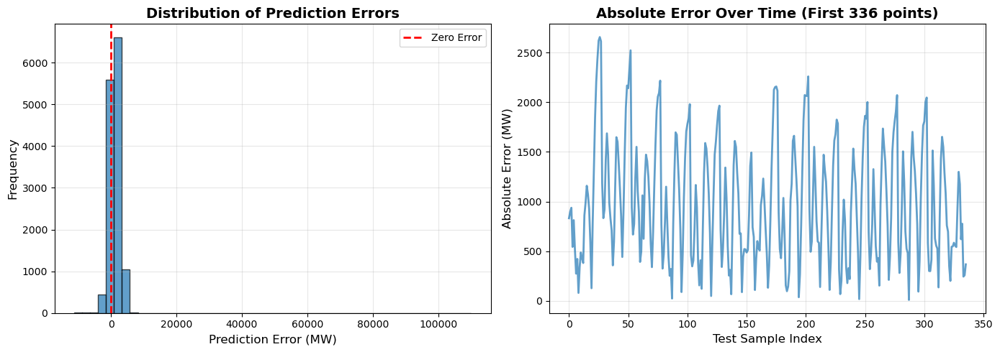


WORKFLOW COMPLETED SUCCESSFULLY! 🎉

Next steps:
1. Analyze the MAPE and prediction accuracy
2. If MAPE > 10%, try increasing SEQUENCE_LENGTH to 336 (2 weeks)
3. Consider adding external features (temperature, holidays, day of week)
4. Experiment with different architectures (more layers, units)
5. Check for outliers or anomalies in the error distribution


In [24]:
# ============================================================================
# BLOCK 14: ERROR ANALYSIS
# ============================================================================
# Calculate prediction errors
errors = y_test_original - y_pred
abs_errors = np.abs(errors)

plt.figure(figsize=(14, 5))

# Error distribution
plt.subplot(1, 2, 1)
plt.hist(errors, bins=50, edgecolor='black', alpha=0.7)
plt.xlabel('Prediction Error (MW)', fontsize=12)
plt.ylabel('Frequency', fontsize=12)
plt.title('Distribution of Prediction Errors', fontsize=14, fontweight='bold')
plt.axvline(x=0, color='red', linestyle='--', linewidth=2, label='Zero Error')
plt.legend()
plt.grid(True, alpha=0.3)

# Error over time
plt.subplot(1, 2, 2)
plt.plot(abs_errors[:n_points], linewidth=2, alpha=0.7)
plt.xlabel('Test Sample Index', fontsize=12)
plt.ylabel('Absolute Error (MW)', fontsize=12)
plt.title(f'Absolute Error Over Time (First {n_points} points)', 
          fontsize=14, fontweight='bold')
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

print("\n" + "="*70)
print("WORKFLOW COMPLETED SUCCESSFULLY! 🎉")
print("="*70)
print("\nNext steps:")
print("1. Analyze the MAPE and prediction accuracy")
print("2. If MAPE > 10%, try increasing SEQUENCE_LENGTH to 336 (2 weeks)")
print("3. Consider adding external features (temperature, holidays, day of week)")
print("4. Experiment with different architectures (more layers, units)")
print("5. Check for outliers or anomalies in the error distribution")
print("="*70)

In [25]:
#FIXME: hacer el escalado despues del train test, además hacer algo más simplificado.
#TODO: guardar el modelo Y el escalado en una subcarpeta /model
#FIXME: usar el PREDICTION_POINTS = 336 realmente, por lo que veo no se usa para visualizar ningun plot aunque dice que si.

In [26]:
unified_df.shape

(92649, 2)

In [27]:
unified_df.columns

Index(['signal', 'target'], dtype='object')

In [28]:
unified_df['target'].describe()

count    92649.000000
mean         0.056482
std          0.017765
min          0.000000
25%          0.043622
50%          0.053934
75%          0.068103
max          1.000000
Name: target, dtype: float64